In [1]:
import torch
import torchvision

train_mnist = torchvision.datasets.MNIST(
    "./data",
    train=True,
    download=True,
    transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.1307,), (0.3081,))
    ])
)

test_mnist = torchvision.datasets.MNIST(
    "./data",
    train=False,
    download=True,
    transform=torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.1307,), (0.3081,))
    ])
)


100%|██████████| 9.91M/9.91M [00:00<00:00, 35.6MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.09MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 10.0MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.68MB/s]


## Data & Transforms (MNIST)
### What we’re doing
We load **MNIST** (28×28 grayscale digits) for **training** and **testing**, and apply standard preprocessing:

- `ToTensor()` converts each image to a tensor in `[0, 1]` with shape `[1, 28, 28]`.
- `Normalize((0.1307,), (0.3081,))` standardizes pixels:
  $$
  x_{\text{norm}} = \frac{x - 0.1307}{0.3081}
  $$
  Using dataset mean/std helps optimization (smoother loss landscape).

We apply the **same transform** to train and test so the model sees consistently scaled inputs at both phases.


## Model: Encoder with μ/σ heads + Decoder (VAE-style bottleneck)
### What we’re building

#### What does VAE stand for?

**VAE = Variational Autoencoder** — a *probabilistic* autoencoder that learns a latent **distribution** instead of a single deterministic code.

- **Encoder (inference model)**: outputs parameters of a Gaussian
  $$
  q_\phi(z \mid x) = \mathcal{N}\big(\mu(x), \sigma(x)\big)
  $$
- **Reparameterization trick** (keeps gradients flowing):
  $$
  z = \mu + \sigma \odot \epsilon,\quad \epsilon \sim \mathcal{N}(0, I)
  $$
- **Decoder (generative model)**: models
  $$
  p_\theta(x \mid z)
  $$
- **Loss (ELBO)** = reconstruction term + KL regularizer:
  $$
  \mathcal{L} = \underbrace{\mathbb{E}_{q_\phi(z\mid x)}[-\log p_\theta(x\mid z)]}_{\text{reconstruction}}
  \;+\;
  \underbrace{\mathrm{KL}\big(q_\phi(z\mid x)\,\|\,\mathcal{N}(0,I)\big)}_{\text{regularization}}
  $$
In practice we minimize the reconstruction loss (e.g., L1/MSE or NLL) **plus** the KL term.

#### What are “heads” in a network?

A **head** is an output branch that sits on top of a shared **trunk** (the common feature extractor).  
Multiple heads let one backbone produce **different outputs** (e.g., class logits, bounding boxes, or—as in a VAE—**μ** and **σ** for the latent).

**In our model:**  
- We have a shared encoder trunk (MLP) ending at a hidden vector `h ∈ ℝ^{300}`.  
- Two **heads** map `h` to:
  - **μ head:** `h → μ ∈ ℝ^d`
  - **σ head:** `h → σ ∈ ℝ^d` (we ensure positivity with `softplus`)

This is why you see code like:
```python
h  = encoder_trunk(x)     # shared features
mu = mu_head(h)           # first head
std = F.softplus(std_head(h)) + 1e-6  # second head, made positive
```

---------

This autoencoder uses a **stochastic bottleneck** (a VAE-style idea):
- The **encoder** maps an input $(x)$ to the parameters of a Gaussian in latent space:
  - a mean vector $(\mu(x))$
  - a (positive) standard deviation vector $(sigma(x))$
- We then **sample** a latent $(z \sim \mathcal{N}(\mu, \sigma))$ using the **reparameterization trick**:
  $$
  z = \mu + \sigma \odot \epsilon,\quad \epsilon \sim \mathcal{N}(0, I)
  $$
  This keeps the operation differentiable.
- The **decoder** maps $(z)$ back to a reconstruction $(\hat{x})$.

> **Why two heads (μ and σ)?**  
> Instead of a single deterministic latent, we learn a **distribution** for each input. This lets us:
> - sample multiple plausible reconstructions (useful for generative behavior),
> - measure **uncertainty** (via σ),
> - and later, add a **KL term** to match a prior (turning it into a true VAE).

---

### Architecture overview (MLP)

- Flatten image: $([B, 1, 28, 28] \rightarrow [B, 784])$
- **Encoder trunk:** $(784 \rightarrow 300 \rightarrow 300)$ with `LeakyReLU`
- **Heads:**  
  - $(\mu)$: $(300 \rightarrow d)$  
  - $(\sigma)$: $(300 \rightarrow d)$, passed through **softplus** to ensure positivity
- **Decoder:** $(d \rightarrow 300 \rightarrow 784)$ with `LeakyReLU`, then unflatten to $([B, 1, 28, 28])$

We return **(μ, σ)** from `encode(x)`, and in `forward(x)` we:
1) compute $((\mu, \sigma) = \text{encode}(x))$  
2) sample $(z)$ with `rsample()` (reparameterization),  
3) `decode(z)` → reconstruction.

---

### Shapes

- Input $(x)$: `[B, 1, 28, 28]`
- After flatten: `[B, 784]`
- Encoder trunk output \(h\): `[B, 300]`
- $(\mu, \sigma)$: `[B, d]` (here \(d = 2\))
- Latent sample \(z\): `[B, d]`
- Decoder output: `[B, 784]` → unflatten → `[B, 1, 28, 28]`

---

### Why `rsample()` not `sample()`?

`rsample()` implements $(z = \mu + \sigma \epsilon)$ explicitly, creating a **differentiable path** from loss back to $(\mu)$ and $(\sigma)$.  
`sample()` would **break** gradient flow through the random node.

---

### About the loss (important note)

The original notebook (as provided during classes) uses **only reconstruction loss** (e.g., L1) without a KL term.  
That makes it a **stochastic autoencoder** (VAE-style bottleneck **without** the variational prior penalty).

- **If you add the KL term**, it becomes a **VAE**:
  $$
  \mathcal{L} = \text{ReconLoss}(x, \hat{x}) \;+\; \beta \cdot \mathrm{KL}\big[\mathcal{N}(\mu,\sigma) \,\|\, \mathcal{N}(0, I)\big]
  $$
- In this notebook, we’ll **stick to reconstruction loss** to mirror the original behavior.

---

### Practical tip

When **visualizing latent features** later, we’ll typically use **μ** as the “feature” (it’s a stable point estimate).  
That’s why we'll have code like:
```python
features, _ = model.encode(x)  # use μ for plotting


In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class AutoEncoder(nn.Module):
    def __init__(self, bottleneck_dim: int = 2):
        super().__init__()

        # Flatten/unflatten to go between images and vectors
        self.flatten   = nn.Flatten()
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(1, 28, 28))

        # ----- Encoder trunk: 784 -> 300 -> 300 -----
        self.encoder = nn.Sequential(
            nn.Linear(28*28, 300),
            nn.LeakyReLU(),
            nn.Linear(300, 300),
            nn.LeakyReLU(),
        )

        # Heads: mean and (positive) std for the Gaussian latent
        self.mu_head  = nn.Linear(300, bottleneck_dim)
        self.std_head = nn.Linear(300, bottleneck_dim)  # will pass through softplus

        # ----- Decoder: d -> 300 -> 784 -----
        self.decoder = nn.Sequential(
            nn.Linear(bottleneck_dim, 300),
            nn.LeakyReLU(),
            nn.Linear(300, 28*28),
        )

    def encode(self, x: torch.Tensor):
        """Return (mu, sigma) for the Gaussian posterior q(z|x)."""
        x = self.flatten(x)           # [B,1,28,28] -> [B,784]
        h = self.encoder(x)           # [B,784] -> [B,300]
        mu = self.mu_head(h)          # [B,d]
        # Ensure positivity for std with softplus, add tiny eps for numerical stability
        std = F.softplus(self.std_head(h)) + 1e-6  # [B,d], strictly > 0
        return mu, std

    def decode(self, z: torch.Tensor):
        """Map latent z back to image space."""
        x_hat_vec = self.decoder(z)             # [B,784]
        x_hat = self.unflatten(x_hat_vec)       # [B,1,28,28]
        return x_hat

    def forward(self, x: torch.Tensor):
        """Sample z ~ N(mu, std) via reparam, then decode."""
        mu, std = self.encode(x)                                    # [B,d], [B,d]
        dist = torch.distributions.Normal(mu, std)
        z = dist.rsample()                                          # reparameterized sample
        x_hat = self.decode(z)                                      # [B,1,28,28]
        return x_hat


### Deterministic AE vs. VAE-style AE (what changed?)

**Deterministic AutoEncoder (previous notebook : [university_exercises/live-ex1](https://github.com/martinaspeciale/pytorch-deep-learning/blob/main/university_exercises/live-ex1.ipynb))**
- **Encoder output:** a single latent vector $( z = f_\phi(x) \in \mathbb{R}^d )$
- **Forward:** `x_hat = decode(encode(x))`
- **Loss:** reconstruction only (e.g., L1 / MSE)
- **Behavior:** one fixed $(z)$ per $(x)$; good recon, not inherently generative
- **Latent space:** can be irregular (no pressure to be Gaussian/continuous)

**VAE-style AutoEncoder (this notebook)**
- **Encoder outputs two heads:** mean and std
  $$
  (\mu(x), \sigma(x)) = g_\phi(x), \quad \sigma > 0
  $$
- **Reparameterization trick:** differentiable sampling
  $$
  z = \mu + \sigma \odot \epsilon, \quad \epsilon \sim \mathcal{N}(0, I)
  $$
- **Forward:** sample \(z\) then decode: `x_hat = decode(z)`
- **Loss (as implemented here):** reconstruction only (L1), so it’s a **stochastic AE** (VAE-style bottleneck without KL)
- **True VAE (optional extension):** add KL term
  $$
  \mathcal{L} = \text{Recon}(x,\hat{x}) \;+\; \beta \cdot \mathrm{KL}\big(\mathcal{N}(\mu,\sigma)\,\|\,\mathcal{N}(0,I)\big)
  $$
  which encourages a smooth, Gaussian latent; enables unconditional sampling $(z \sim \mathcal{N}(0,I))$

**Why two heads?**
- The **μ head** gives the center of the latent for each input.
- The **σ head** (made positive with `softplus`) gives uncertainty / spread.
- For plots, we usually use **μ** as the feature (stable, deterministic):
  ```python
  mu, std = model.encode(x)
  features = mu


### How does the reparameterization trick work?

**Problem.** We want to sample a latent $z$ from a distribution that depends on learnable parameters (e.g., $q_\phi(z\mid x)=\mathcal{N}(\mu(x), \sigma(x))$) and still **backpropagate** through that sampling. Naively sampling breaks the computation graph.

-------
### What is “naively sampling”?

**Naively sampling** means drawing a random latent $z$ from a distribution that depends on learnable parameters (e.g., $z \sim \mathcal{N}(\mu(x), \sigma(x))$) **without** using a differentiable path back to those parameters.

Concretely, this is what happens when you:
- call a non-reparameterized sampler (e.g., `Normal(mu, std).sample()`),
- or sample with a function that’s **outside** the autograd graph (e.g., NumPy random),
- or otherwise create $z$ in a way that **doesn’t express** $z$ as a differentiable function of $\mu$ and $\sigma$.

**Why it’s a problem (for VAEs):**
- Backprop needs $\nabla_{\mu,\sigma}\,\mathbb{E}_{z\sim q_{\mu,\sigma}}[\,\mathcal{L}(z)\,]$.
- If $z$ is produced by a non-differentiable sampling step, gradients **don’t flow** to $\mu,\sigma$ (they’re zero/undefined).
- You can fall back to score-function estimators (REINFORCE), but they have **high variance**.

**Fix: reparameterization trick**
Express the random variable as a deterministic function of parameters and external noise:
$$
\varepsilon \sim \mathcal{N}(0,I),\qquad
z \;=\; \mu \;+\; \sigma \odot \varepsilon.
$$
Now $z$ is differentiable w.r.t. $\mu,\sigma$, so gradients flow with low variance.

**Rule of thumb**
- **Naive**: “sample directly from the parameterized distribution” → breaks the gradient path.
- **Proper**: “sample noise, then transform” ($z=\mu+\sigma\odot\varepsilon$ or `rsample()`) → keeps the gradient path.

-------

**Idea (pathwise derivative).** Write the random variable $z$ as a **deterministic** function of the parameters and an auxiliary noise $\varepsilon$ that does **not** depend on the parameters:
$$
\varepsilon \sim \mathcal{N}(0, I), \qquad
z \;=\; \mu \;+\; \sigma \odot \varepsilon \;\sim\; \mathcal{N}\!\big(\mu, \mathrm{diag}(\sigma^2)\big).
$$

Now $z$ is differentiable w.r.t. $\mu$ and $\sigma$. For any loss $\mathcal{L}(z)$:
$$
\frac{\partial z}{\partial \mu} = \mathbf{1}, \qquad
\frac{\partial z}{\partial \sigma} = \varepsilon,
$$
and by chain rule:
$$
\frac{\partial \mathcal{L}}{\partial \mu} = \frac{\partial \mathcal{L}}{\partial z}, 
\qquad
\frac{\partial \mathcal{L}}{\partial \sigma} = \frac{\partial \mathcal{L}}{\partial z} \odot \varepsilon.
$$

**Why it works.**
- The randomness is isolated in $\varepsilon$ (independent of the network parameters).
- The mapping $(\mu, \sigma, \varepsilon) \mapsto z$ is **differentiable**, so autograd can propagate gradients.

**Implementation details.**
- Ensure $\sigma > 0$. Common parameterizations:
  - **Softplus:** $\sigma = \mathrm{softplus}(s) + \epsilon$ (small $\epsilon$ like $1\text{e-}6$ for stability).
  - **Log-variance:** predict $\,\log \sigma^2\,$ and set $\sigma = \exp(0.5\,\log \sigma^2)$.
- In PyTorch, use **`rsample()`** (reparameterized) instead of `sample()` for distributions:
  - `z = Normal(mu, std).rsample()` implements $z=\mu+\sigma\odot\varepsilon$ under the hood.

**Notes.**
- For clean **2D latent plots**, use $\mu$ (a stable point estimate). Use sampled $z$ for **generative decoding**.
- When no simple reparameterization exists (e.g., categorical), use **Gumbel–Softmax** or score-function estimators (higher variance).


[youtube video source](https://youtu.be/vy8q-WnHa9A)
## Variational Auto Encoder (VAE) Architecture 
* NN that does not reconstruct samples, but generates **new** samples, that should be close to the original ones. 
* we sample $z$ from a Gaussian distribution and then we feed it to a decoder that generates, again, a **new, unseen** sample which should resamble the original input


Whenever we want to train our network, we need to generate a sample and then using backpropagation and gradient descent we need to differenciate back in order to tune the parameters of the decoder and the encoder. 
* The stochastic process (sampling $z$) does not help us to get to the derivative of the loss function
* **PROBLEM**: backpropagation will not compute an estimate of the derivative through a "random node"
* **SOLUTION**: *The Reparameterization Trick*
<img src="https://i.imgur.com/3rEeKds.png" alt="diagram" width="800">

  ### how can this help?
 <img src="https://i.imgur.com/LfmxY2n.png" width="420" alt="fig-1">

  we take the randomness outside of the $z$ node, which enables us to differentiate
  <img src="https://i.imgur.com/WcrKU3r.png" width="420" alt="fig-2"><br>

  <img src="https://i.imgur.com/k9Okhov.png" width="420" alt="fig-3">


  * $p$ : probability density function
  * $E_{p(x)}[f(x)]$: the expectation of some function $f$ - which could be our *loss function* - that receives $x$ as input, where $x$ is taken from some distribution $p$.
  * if $x$ is continuous, than we can replace the *expectation* sign $E$ with the **intagral** sign
  * *Leibniz integral rule* : if we differenciate a function inside the integral, then in some cases, if that function has some properties, than we can move the gradient operator inside the integral sign

## Minimize $E_{p(z)}[f_{\theta}(z)]$
* $f$ : loss function
* let's assume we can minimize our loss function using backpropagation and gradient descent
* in order to do so we need to compute the derivative of the expectation
  $$ \nabla_{\theta}E_{p(z)}[f_{\theta}(z)] = \nabla_{\theta}\left[\int_{Z}p(z)f_{\theta}(z) dz\right]$$
  * $\theta$ : model parameters **known**
  <img src="https://i.imgur.com/eN9GMJ2.png" width="420" alt="fig-4"><br>

## Minimize $E_{p_{\theta}(z)}[f_{\theta}(z)]$
  * $\theta$ : model parameters **unknown**
  <img src="https://i.imgur.com/5VjhhDW.png" width="420" alt="fig-5">

  * the **second term** is ok:
    * we can differenciate the function
    * we can sample from this unknown distribution (we just don't have the parameters, but we can still sample from the distribution $p$)
  * the **first term** however, is cannot be simplified with an expectation. We cannot calculate the derivative $$\nabla_{\theta}p_{\theta}(z)$$ --> **this is where the reparametrization trick comes in**
  <img src="https://i.imgur.com/SfGkUsh.png" width="420" alt="fig-6"><br>


## THE REPARAMETRIZATION TRICK 
$$
g_{\theta}(\epsilon, x) = z
$$
  <img src="https://i.imgur.com/grZgRaz.png" width="420" alt="fig-7">

* note that when we write this last equation, the distribution where we sample from is $p(\epsilon)$, which is known --> **this helps us calculate the derivative**
* in **Variational AutoEncoders** we use the trick in order to be able to compute the gradient and train the model
  <img src="https://i.imgur.com/P3wnJTv.png" width="420" alt="fig-8">

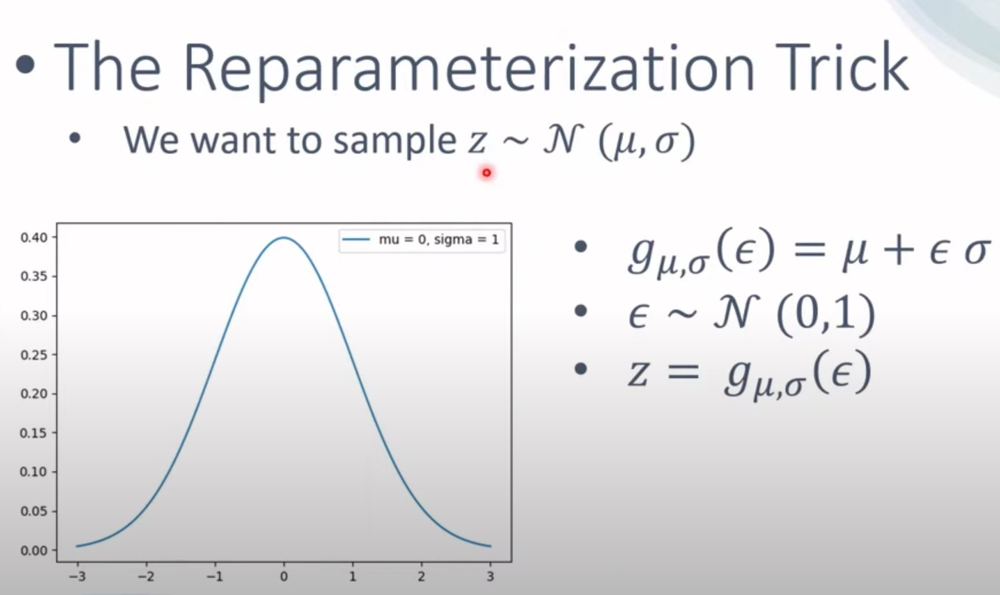
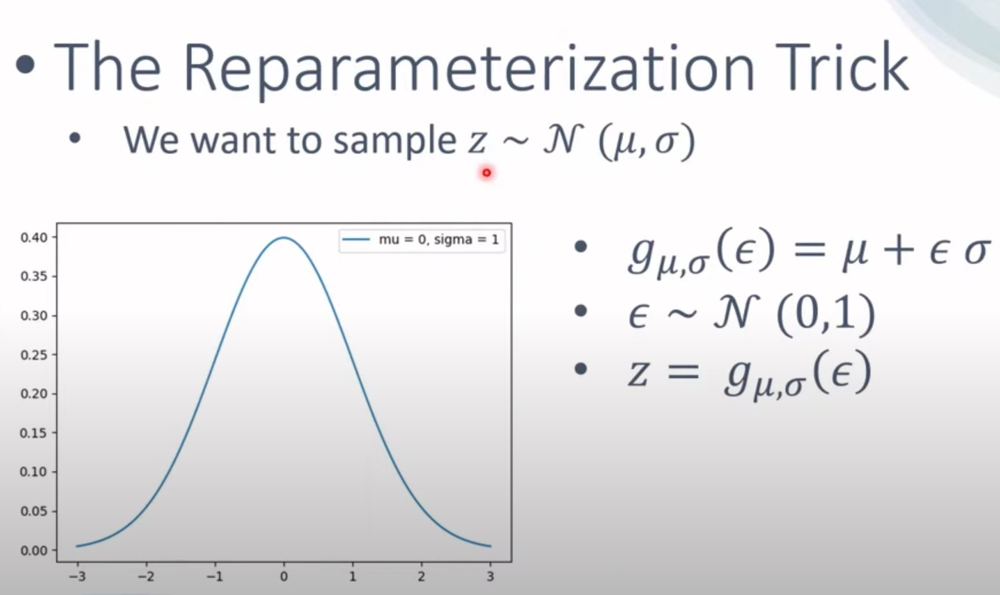
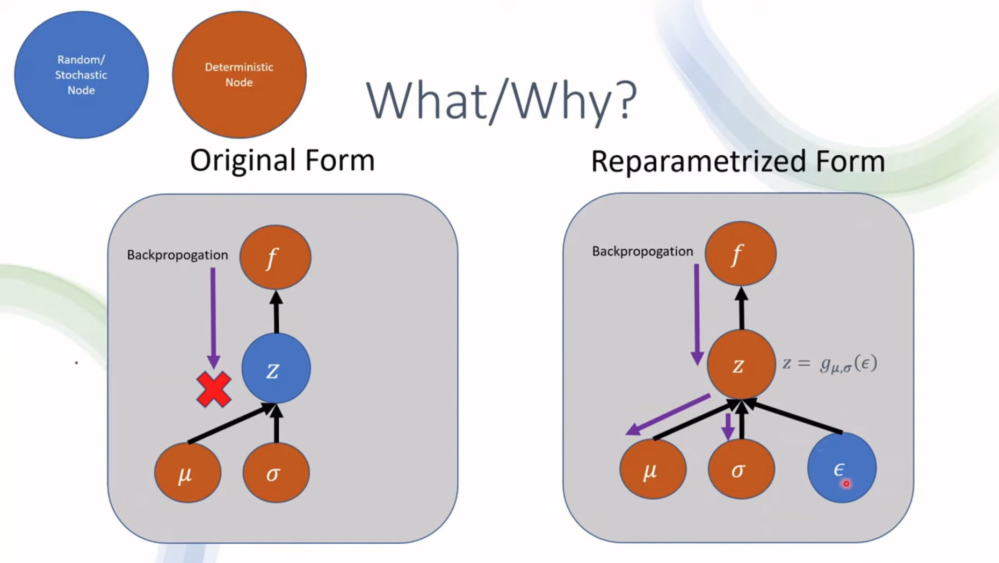
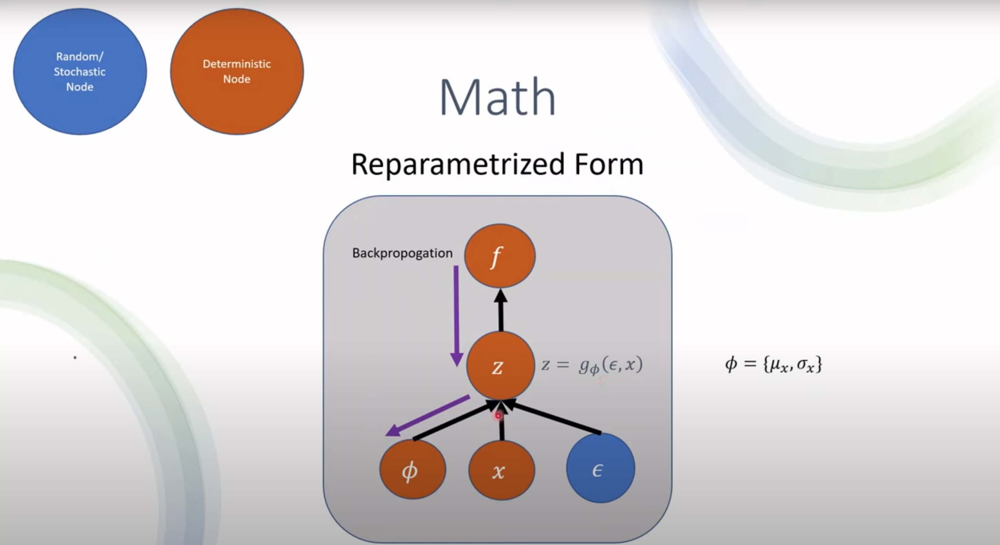
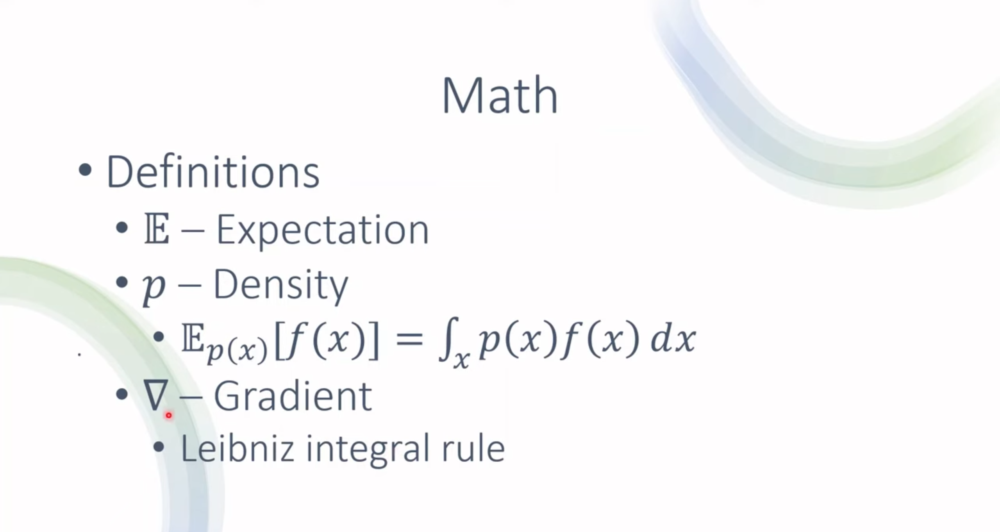
...
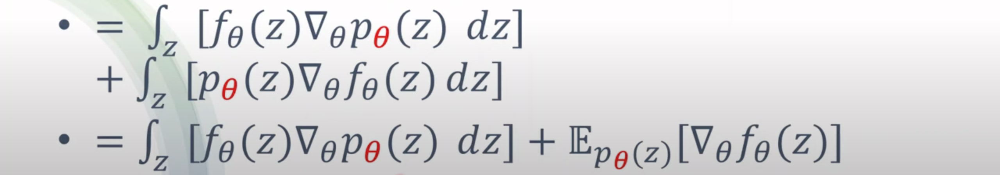
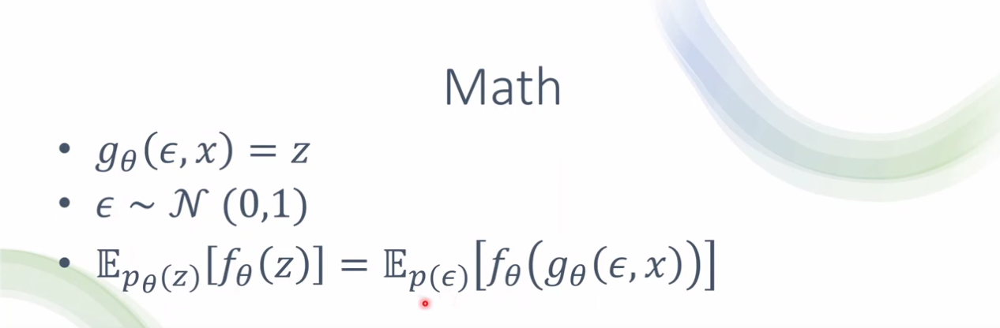
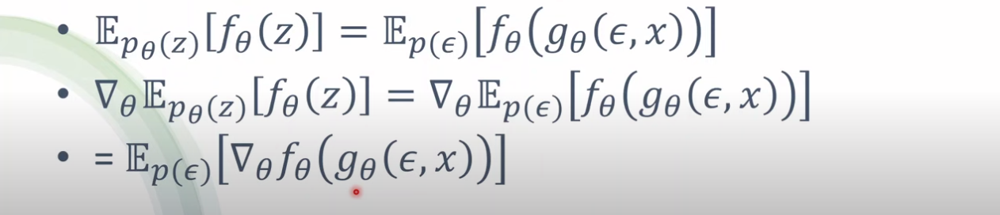
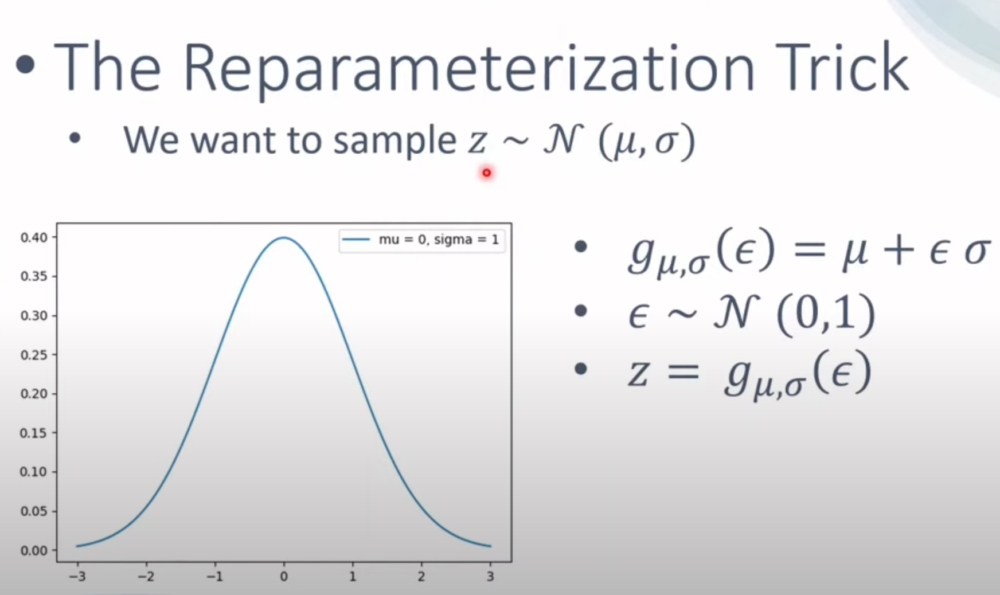
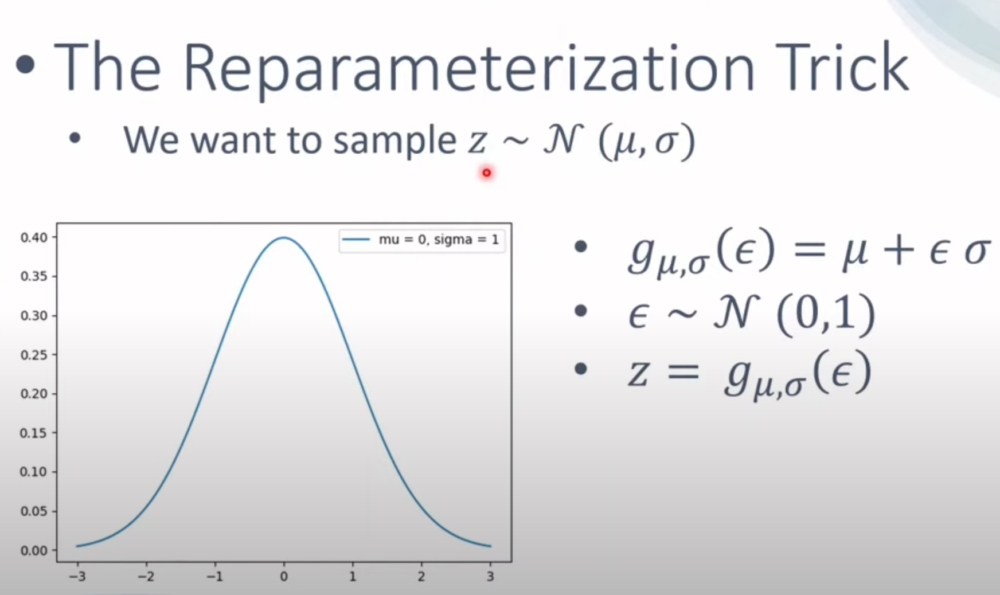